[<img src="images/front_page.jpg" width="900" target="_blank" alt="Click to go to this project's GitHub repository" title="Click to go to this project's GitHub repository"/>](https://github.com/AAZG/Implementation-of-binary-classification-for-Credit-Card-Fraud-Detection)

# Implementation of binary classification for Credit Card Fraud Detection

## About The Dataset :-
### Context

It is important that credit card companies are able to recognize fraudulent credit card transactions so that customers are not charged for items that they did not purchase.


<p>
  Enlace to <a
    href="https://www.kaggle.com/datasets/mlg-ulb/creditcardfraud"
    title="The best place to find dataset and learn data science"
    >Dataset in Kaggle</a
  >.
</p>

[<img src="images/image1.jpg" target="_blank" alt="Click to go to dataset in Kaggle" title="Click to go to dataset in Kaggle"/>](https://www.kaggle.com/datasets/mlg-ulb/creditcardfraud)

### Content

The dataset contains transactions made by credit cards in September 2013 by European cardholders.
This dataset presents transactions that occurred in two days, where we have 492 frauds out of 284,807 transactions. The dataset is highly unbalanced, the positive class (frauds) account for 0.172% of all transactions.

It contains only numerical input variables which are the result of a PCA transformation. Unfortunately, due to confidentiality issues, we cannot provide the original features and more background information about the data. Features V1, V2, … V28 are the principal components obtained with PCA, the only features which have not been transformed with PCA are 'Time' and 'Amount'. Feature 'Time' contains the seconds elapsed between each transaction and the first transaction in the dataset. The feature 'Amount' is the transaction Amount, this feature can be used for example-dependant cost-sensitive learning. Feature 'Class' is the response variable and it takes value 1 in case of fraud and 0 otherwise.

Given the class imbalance ratio, we recommend measuring the accuracy using the Area Under the Precision-Recall Curve (AUPRC). Confusion matrix accuracy is not meaningful for unbalanced classification.

#### Attributes
##### Characteristics Identification
1. Time (seconds elapsed between each transaction and the first transaction in the dataset)
2. Amount (transaction Amoun)
3. Class (variable target and it takes value 1 in case of fraud and 0 otherwise)
4. Features V1...v28 (are the principal components obtained with PCA)


><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>In the Attributes:
<br>- We are somewhat restricted in terms of relevant information on the variables of the V1-V28 dataset, since for reasons of banking confidentiality they were reduced with PCA, but we are not told the exact number of variables that were, in order to contextualize a bit about the magnitude of our dataset, for example if there were 100 variables and they were reduced to 28, perhaps this indicates that the pca was carried out correctly, but without some context, we could not use robust methods, for example, to treat outliers. We will have to be guided as much as possible by the data we have, using the mean and the standard deviation of our V1-V28.
></ul>
></div>


### Target
Need to carry out a classification to determine the legality or fraud in transactions made with credit cards of the bank's customers.

## Import library

In [16]:
!python -m pip install -q --upgrade pip
!pip install -q -r requirements.txt

In [17]:
# Miscellaneous
from __future__ import print_function
from IPython.display import display

#Importing Requierd Libraries
import pandas as pd 
import numpy as np

# For interactive graphics
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from ydata_profiling import ProfileReport
from yellowbrick.classifier import ClassPredictionError
from tqdm.notebook import trange, tqdm

# Sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_blobs
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve, roc_auc_score, precision_score, f1_score, RocCurveDisplay, confusion_matrix, ConfusionMatrixDisplay, classification_report, accuracy_score, recall_score
from sklearn.model_selection import train_test_split, LearningCurveDisplay, ShuffleSplit
from imblearn.pipeline import Pipeline
## Algorithms for Binary Classification
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, VotingClassifier
## Visualization of Decision Tree
from sklearn.tree import plot_tree, export_text

# Scipy metods robust for outlier treatment
from scipy.stats import gmean, gstd, describe
from scipy.stats.mstats import winsorize

# Magics Funtions
%load_ext autoreload
%autoreload 2
%run "template_visualitation.ipynb" # Export function pandas_title()
%run "pandas-missing-extension.ipynb" # Export missing functions from the API of Pandas library

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Carga de datos

In [18]:
%%time
df_data = pd.read_csv('creditcard.csv')

CPU times: user 1.76 s, sys: 165 ms, total: 1.92 s
Wall time: 1.92 s


### Convert to Feather to reduce load + save of DataFrame

In [19]:
df_data.to_feather("creditcard.feather")

In [20]:
%%time
df_data = pd.read_feather("creditcard.feather")

CPU times: user 73.6 ms, sys: 135 ms, total: 208 ms
Wall time: 79.9 ms


In [21]:
pandas_title(df_data.describe().iloc[:,0:15].style.format('{:.5f}').applymap(above_zero), 'Describe Data: First middle')
pandas_title(df_data.describe().iloc[:,16:].style.format('{:.5f}').applymap(above_zero), 'Describe Data: Second middle')

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14
count,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000
mean,94813.85958,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000
std,47488.14595,1.95870,1.65131,1.51626,1.41587,1.38025,1.33227,1.23709,1.19435,1.09863,1.08885,1.02071,0.99920,0.99527,0.95860
min,0.00000,-56.40751,-72.71573,-48.32559,-5.68317,-113.74331,-26.16051,-43.55724,-73.21672,-13.43407,-24.58826,-4.79747,-18.68371,-5.79188,-19.21433
25%,54201.50000,-0.92037,-0.59855,-0.89036,-0.84864,-0.69160,-0.76830,-0.55408,-0.20863,-0.64310,-0.53543,-0.76249,-0.40557,-0.64854,-0.42557
50%,84692.00000,0.01811,0.06549,0.17985,-0.01985,-0.05434,-0.27419,0.04010,0.02236,-0.05143,-0.09292,-0.03276,0.14003,-0.01357,0.05060
75%,139320.50000,1.31564,0.80372,1.02720,0.74334,0.61193,0.39856,0.57044,0.32735,0.59714,0.45392,0.73959,0.61824,0.66250,0.49315
max,172792.00000,2.45493,22.05773,9.38256,16.87534,34.80167,73.30163,120.58949,20.00721,15.59499,23.74514,12.01891,7.84839,7.12688,10.52677


,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000
mean,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,88.34962,0.00173
std,0.87625,0.84934,0.83818,0.81404,0.77093,0.73452,0.72570,0.62446,0.60565,0.52128,0.48223,0.40363,0.33008,250.12011,0.04153
min,-14.12985,-25.16280,-9.49875,-7.21353,-54.49772,-34.83038,-10.93314,-44.80774,-2.83663,-10.29540,-2.60455,-22.56568,-15.43008,0.00000,0.00000
25%,-0.46804,-0.48375,-0.49885,-0.45630,-0.21172,-0.22839,-0.54235,-0.16185,-0.35459,-0.31715,-0.32698,-0.07084,-0.05296,5.60000,0.00000
50%,0.06641,-0.06568,-0.00364,0.00373,-0.06248,-0.02945,0.00678,-0.01119,0.04098,0.01659,-0.05214,0.00134,0.01124,22.00000,0.00000
75%,0.52330,0.39967,0.50081,0.45895,0.13304,0.18638,0.52855,0.14764,0.43953,0.35072,0.24095,0.09105,0.07828,77.16500,0.00000
max,17.31511,9.25353,5.04107,5.59197,39.42090,27.20284,10.50309,22.52841,4.58455,7.51959,3.51735,31.61220,33.84781,25691.16000,1.00000


><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>At first glance at the data:
<br>- There are 284807 entries and 31 columns.
<br>- Column 'Amount' has somewhat high values in std and mean.
></ul>
></div>

### Memory Reduction to DataFrame

In [22]:
memory_usage = df_data.memory_usage(deep=True) / 1024 ** 2
memory_usage.loc['total'] = memory_usage.sum()
memory_usage = memory_usage.to_frame(name="memory usage of variable (MB)")
pandas_title(memory_usage, 'memory usage of features', True).bar(subset=["memory usage of variable (MB)",], color='#ee1f5f', axis=0).format("{:.6f} MB")

,memory usage of variable (MB)
Index,0.000122 MB
Time,2.172905 MB
V1,2.172905 MB
V2,2.172905 MB
V3,2.172905 MB
V4,2.172905 MB
V5,2.172905 MB
V6,2.172905 MB
V7,2.172905 MB
V8,2.172905 MB


><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>In our examined column:
<br>- Although we have already optimized the loading time of the dataset quite a lot using the .feather format, we can also optimize the size in memory with a small python script. We will apply this function to our dataset every time we apply some format or transformation that changes its size.
></ul>
></div>

In [23]:
def reduce_memory_usage(df, verbose=True):
    numerics = ["int8", "int16", "int32", "int64", "float16", "float32", "float64"]
    start_mem = df.memory_usage().sum() / 1024 ** 2
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == "int":
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if (
                    c_min > np.finfo(np.float16).min
                    and c_max < np.finfo(np.float16).max
                ):
                    df[col] = df[col].astype(np.float16)
                elif (
                    c_min > np.finfo(np.float32).min
                    and c_max < np.finfo(np.float32).max
                ):
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
    end_mem = df.memory_usage().sum() / 1024 ** 2
    if verbose:
        print(
            "Mem. usage decreased to {:.2f} Mb ({:.1f}% reduction)".format(
                end_mem, 100 * (start_mem - end_mem) / start_mem
            )
        )
    return df

df_data = reduce_memory_usage(df_data, verbose=True)

Mem. usage decreased to 17.11 Mb (74.6% reduction)


In [24]:
pd.DataFrame(df_data.info(memory_usage="deep"))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float32
 1   V1      284807 non-null  float16
 2   V2      284807 non-null  float16
 3   V3      284807 non-null  float16
 4   V4      284807 non-null  float16
 5   V5      284807 non-null  float16
 6   V6      284807 non-null  float16
 7   V7      284807 non-null  float16
 8   V8      284807 non-null  float16
 9   V9      284807 non-null  float16
 10  V10     284807 non-null  float16
 11  V11     284807 non-null  float16
 12  V12     284807 non-null  float16
 13  V13     284807 non-null  float16
 14  V14     284807 non-null  float16
 15  V15     284807 non-null  float16
 16  V16     284807 non-null  float16
 17  V17     284807 non-null  float16
 18  V18     284807 non-null  float16
 19  V19     284807 non-null  float16
 20  V20     284807 non-null  float16
 21  V21     28

""


## Data cleaning and manipulation

### Missing imputation

In [25]:
df_data_processing = df_data.copy()
pandas_title(df_data_processing.missing.missing_variable_summary().set_index('variable').T.style.format('{:.0f}'), 'Quantity and percentage of Missing Values')


variable,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
n_missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
n_cases,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807
pct_missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>At first glance at the data:
<br>- There is no missing data.
></ul>
></div>

### Duplicate data handling

In [26]:
pandas_title(df_data_processing[df_data_processing.duplicated()].head(5).style.format('{:.4f}'), 'Values Duplicate')

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
33,26.0000,-0.5298,0.8740,1.3477,0.1455,0.4143,0.1002,0.7114,0.1760,-0.2866,-0.4846,0.8726,0.8516,-0.5718,0.1010,-1.5195,-0.2844,-0.3105,-0.4043,-0.8232,-0.2903,0.0469,0.2081,-0.1855,0.0010,0.0988,-0.5527,-0.0733,0.0233,6.1406,0.0000
35,26.0000,-0.5352,0.8652,1.3516,0.1476,0.4336,0.0870,0.6929,0.1797,-0.2856,-0.4824,0.8716,0.8535,-0.5718,0.1022,-1.5195,-0.2859,-0.3096,-0.4038,-0.8237,-0.2832,0.0495,0.2065,-0.1871,0.0008,0.0981,-0.5537,-0.0783,0.0254,1.7695,0.0000
113,74.0000,1.0381,0.1274,0.1844,1.1104,0.4417,0.9453,-0.0367,0.3511,0.1190,-0.2433,0.5781,0.6748,-0.5342,0.4465,1.1230,-1.7676,1.2412,-2.4492,-1.7471,-0.3354,0.1025,0.6050,0.0231,-0.6265,0.4790,-0.1670,0.0812,0.0012,1.1797,0.0000
114,74.0000,1.0381,0.1274,0.1844,1.1104,0.4417,0.9453,-0.0367,0.3511,0.1190,-0.2433,0.5781,0.6748,-0.5342,0.4465,1.1230,-1.7676,1.2412,-2.4492,-1.7471,-0.3354,0.1025,0.6050,0.0231,-0.6265,0.4790,-0.1670,0.0812,0.0012,1.1797,0.0000
115,74.0000,1.0381,0.1274,0.1844,1.1104,0.4417,0.9453,-0.0367,0.3511,0.1190,-0.2433,0.5781,0.6748,-0.5342,0.4465,1.1230,-1.7676,1.2412,-2.4492,-1.7471,-0.3354,0.1025,0.6050,0.0231,-0.6265,0.4790,-0.1670,0.0812,0.0012,1.1797,0.0000


In [27]:
df_data_processing.duplicated().value_counts()

False    283726
True       1081
dtype: int64

In [28]:
df_data_processing.drop_duplicates(inplace=True)

><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>In our examined column:
<br>- The reasons for having duplicate transactions with credit cards can be several. One of the most frequent is that a computer error occurs that duplicates the operation, either from the company where we buy or from the bank. We will discard the duplicate operations, since they do not provide additional information.
></ul>
></div>

### Number of unique values present in each column

In [29]:
pandas_title(df_data_processing.nunique().to_frame(name="Quantity ").T, 'Unique values')

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Quantity,124592,17239,21462,18221,18661,20454,19734,21084,23301,19442,21042,17517,19264,18406,20199,18066,18899,19236,18716,19281,22820,22264,18352,22698,19392,18426,17050,23887,23023,8976,2


><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>In our examined columns:
<br>- We present diversity in our variables.
></ul>
></div>

In [30]:
df_data_processing = reduce_memory_usage(df_data_processing, verbose=True)

Mem. usage decreased to 19.21 Mb (0.0% reduction)


## EDA

### Univariate analysis with Pandas Profiling library

In [31]:
profile = ProfileReport(
    df_data_processing, title="Pandas Profiling Report", html={"style": {"primary_color": "#FA0087"}},
    minimal=True
)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>In our examined graphs:
<br>-  Time - multimodal distribution
<br>
<br>-  V1-v28 -  They present asymmetric distribution and symmetric distribution, notable presence of outliers in almost all these variables.
<br>
<br>-  Amount - right asymmetric distribution
<br>-  Class - 2 classed
></ul>
></div>

### Percentage analysis of categorical variables:

In [32]:
labels, counts=np.unique(df_data_processing.Class, return_counts=True)

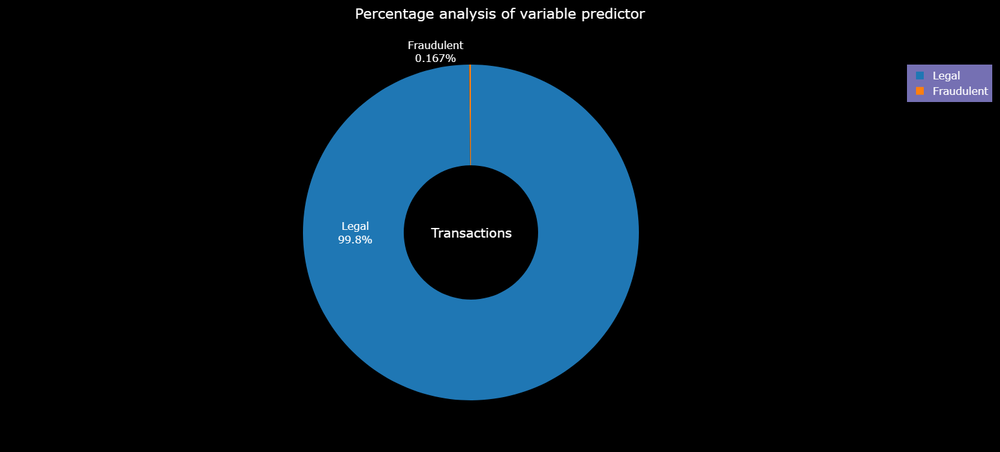

In [33]:
fig = go.Figure(data=[go.Pie(labels=['Legal', 'Fraudulent'], values=counts, insidetextorientation='radial', hole=.4)])
fig.update_traces(textposition='auto', textinfo='percent+label')
# fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.update_layout(
    title_text="Percentage analysis of variable predictor",
    title_y=0.98,
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Transactions', x=0.5, y=0.5, font_size=20, showarrow=False)])
fig.show()

><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>In our examined graphs:
<br>- We can appreciate that our target variable is a bit unbalanced.
></ul>
></div>

Distribution### Distribution Analysis

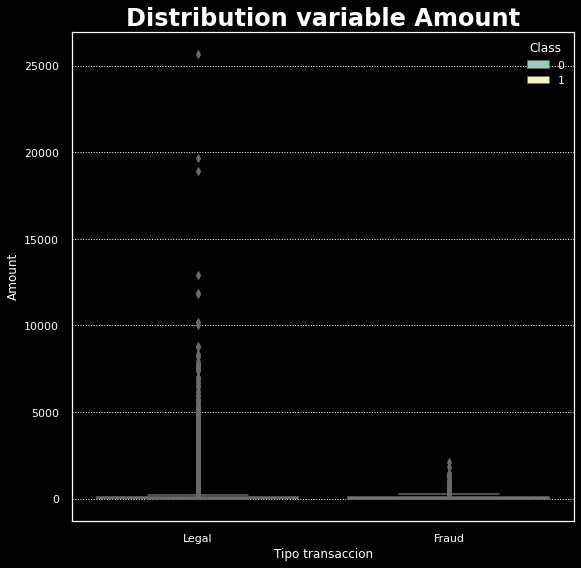

In [34]:
ax = sns.boxplot(data=df_data_processing, y='Amount', x='Class', hue="Class", dodge=False);
ax.set_xticklabels(["Legal", "Fraud"])
ax.set_xlabel("Tipo transaccion")
plt.title("Distribution variable Amount", fontsize=24, fontdict={"weight": "bold"})
plt.show()

><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>In our examined graphs:
<br>- There are many outliers in the Amount variable, but this is because there are transactions for high amounts with credit cards. Because they are transactions created by an international banking system that is quite reliable, the possibility that they are false data is totally ruled out.
<br>- But this does not solve our problem, since our model could give more weight to these outliers, therefore we will try to use robust methods to treat them as much as possible, affecting as little as possible the original representation that the data presented .
<br>- As we saw previously, our fraudulent transactions variable has very little data, and we are not interested in losing this data. The best option is to remove weight from these extreme outliers using robust techniques respecting fraudulent transaction data. You can read the [article](https://www.maximaformacion.es/blog-dat/como-lidiar-con-los-datos-atipicos-outliers/) to familiarize yourself with robust methods for outlier treatment
></ul>
></div>

In [35]:
report_fraud = describe(df_data_processing['Amount'].astype("float32")[(df_data_processing['Class'] == 1)])._asdict()
report_legal = describe(df_data_processing['Amount'].astype("float32")[(df_data_processing['Class'] == 0)])._asdict()
report_amount = pd.DataFrame([report_legal, report_fraud], columns=report_legal.keys(), index=['Legal', 'Fraud'])
pandas_title(report_amount, 'Describe variable Amount')

,nobs,minmax,mean,variance,skewness,kurtosis
Legal,283253,"(0.0, 25696.0)",88.413948,62692.846332,17.008026,846.598719
Fraud,473,"(0.0, 2126.0)",123.874374,67716.742485,3.712872,17.140846


><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>In our examined graphs:
<br>- We have that our robust method must respect the minimum value of 0 and the maximum value of 2126 dollars, so as not to lose our few and valuable samples of fraudulent transactions.
<br>- We will apply the winsorization to our variable 'Amount' to substitute the values of the outliers that are outside the range that we have proposed.
<br>- Due to the presence of so many outliers, even after winsorizing our variable, taking the arithmetic mean may not be a true representative, for this reason we will use the weighted geometric mean and geometric standard deviation as a measurement measure, the highest values will be filtered to 0, since these methods do not work with this value since the equation is null, read the document on the subject [here](https://www.statology.org/geometric-mean-python/#:~:text=the%20previous%20example.-,How%20to%20Handle%20Zeros,-Note%20that%20both) or [here](), this [article](https://www.wwdmag.com/monitoring/level-measurement/article/10976839/handling-zeros-in-geometric-mean-calculation#:~:text=from%20the%20result.-,Blank%20and%200%20values,-are%20ignored%20in) deals with 3 methods to deal with zero values in the geometric mean, the method of ignoring them for the calculation was selected, which is reaffirmed [here](https://math.stackexchange.com/questions/3289611/is-it-correct-to-add-0-1-to-all-values-before-calculating-geometric-mean) and [here](https://math.stackexchange.com/questions/91443/geometric-mean-of-a-dataset-containing-0s). We will use these methods since the extreme values/outliers have less influence than the arithmetic mean and the common standard deviation.
></ul>
></div>

In [36]:
print(f'Weighted geometric mean for data Amount = {gmean(df_data_processing["Amount"][(df_data_processing["Amount"] > 0)].astype("float32"))}')
print(f'Geometric standard deviation for data Amount = {gstd(df_data_processing["Amount"][(df_data_processing["Amount"] > 0)].astype("float32"))}\n\n')

# we apply average winsorize to replace 0.2% of the outliers
amount_winsorize = winsorize(df_data_processing['Amount'].astype("float32"), limits=[0, 0.002])

# comparative report with normal mean and variance
report_amount_winsorize = describe(amount_winsorize)._asdict()
report_amount_winsorize = pd.DataFrame([report_amount_winsorize], columns=report_amount_winsorize.keys(), index=['Amount winsorize'])
pandas_title(report_amount_winsorize, 'Describe amount_winsorize')
print('\n')

print(f'Weighted geometric mean for data winsorize Amount = {gmean(amount_winsorize.data[amount_winsorize.data != 0])}')
print(f'Geometric standard deviation for data winsorize Amount = {gstd(amount_winsorize.data[amount_winsorize.data != 0])}')
df_data_processing["Amount"] = amount_winsorize.data

Weighted geometric mean for data Amount = 20.21956443786621
Geometric standard deviation for data Amount = 6.49247932434082




,nobs,minmax,mean,variance,skewness,kurtosis
Amount winsorize,283726,"(0.0, 2202.0)",85.816895,40511.900598,5.840481,44.767193




Weighted geometric mean for data winsorize Amount = 20.203454971313477
Geometric standard deviation for data winsorize Amount = 6.478544235229492


In [37]:
report_fraud = describe(df_data_processing['Amount'].astype("float32")[(df_data_processing['Class'] == 1)])._asdict()
report_legal = describe(df_data_processing['Amount'].astype("float32")[(df_data_processing['Class'] == 0)])._asdict()
report_amount = pd.DataFrame([report_legal, report_fraud], columns=report_legal.keys(), index=['Legal', 'Fraud'])

pandas_title(report_amount, 'Describe variable Amount processed')

,nobs,minmax,mean,variance,skewness,kurtosis
Legal,283253,"(0.0, 2202.0)",85.753334,40464.279574,5.846539,44.862500
Fraud,473,"(0.0, 2126.0)",123.874374,67716.742485,3.712872,17.140846


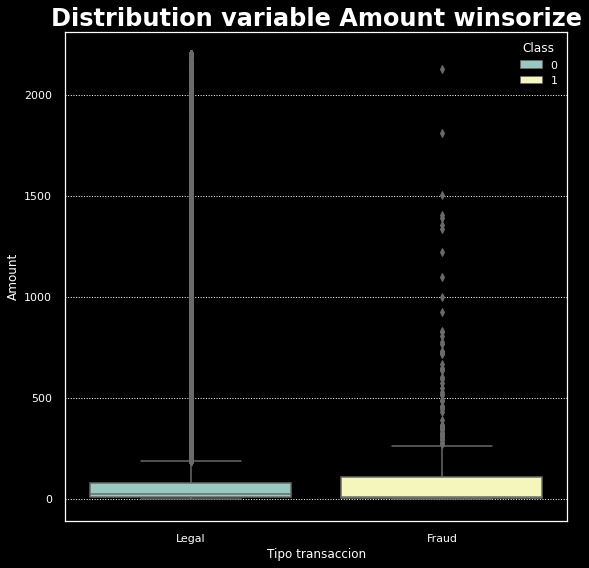

In [38]:
ax = sns.boxplot(data=df_data_processing, y='Amount', x='Class', hue="Class", dodge=False);
ax.set_xticklabels(["Legal", "Fraud"])
ax.set_xlabel("Tipo transaccion")
plt.title("Distribution variable Amount winsorize", fontsize=24, fontdict={"weight": "bold"})
plt.show()

><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>In our examined graphs:
<br>- We substitute 0.2% of the data/outliers of legal transactions, but these transactions for large amounts will probably require a double validation process by the bank to approve them, either a phone call with a bank operator or a process additional. From this hypothesis we deduce that there are no fraudulent transactions for large amounts in our dataset.
<br>- The alternative of applying the Box-Cox power transformation to the variable 'Amount' could be taken to eliminate the right asymmetric distribution in the data, such is the case as supported in the following [article](https://www.isixsigma.com/normality/dealing-non-normal-data-strategies-and-tools/#:~:text=Reason%205%3A%20Values%20Close%20to%20Zero%20or%20a%20Natural%20Limit), but the application of Box-Cox in logistic regression is discouraged in this [answer](https://stats.stackexchange.com/questions/388302/does-boxcox-transformation-work-for-logistic-regression#:~:text=The%20box%2DCox%20transformation), because the transformation into a normal distribution is a means to an end, not the end itself, and we won't perform any tests that require our data to take a normal distribution form. Likewise, in the event that someone in the future needs to perform Cp/Cpk analysis, t tests, analysis of variance (ANOVA), etc. You already have the alternative of modifying the code, not applying winsorization and applying Box-Cox with the [scipy](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.boxcox.html).
></ul>
></div>

### Correlation Analysis

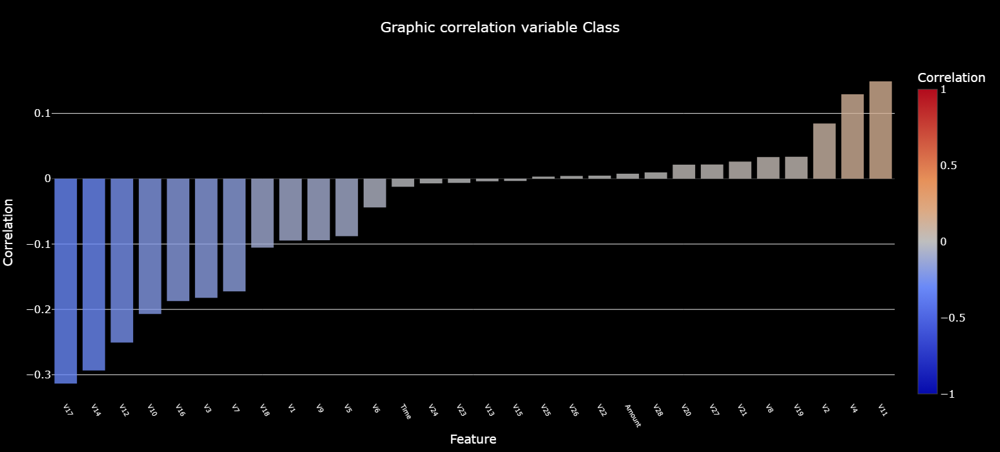

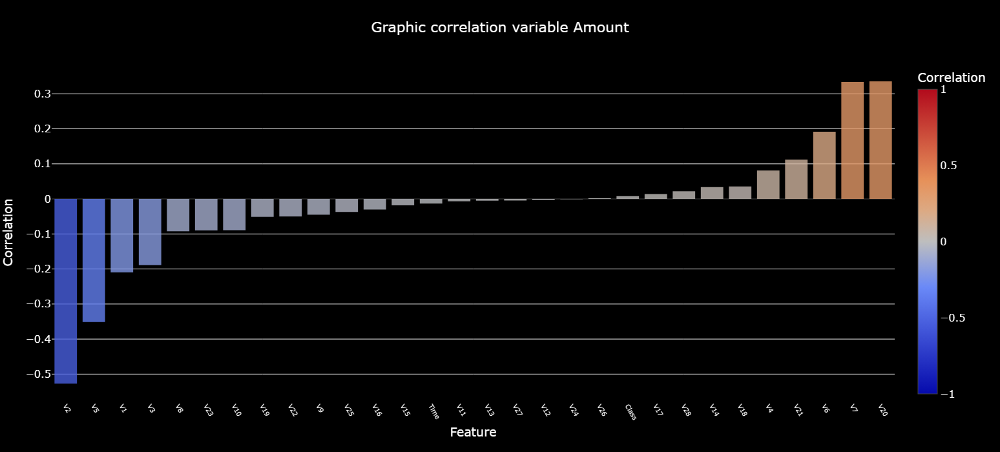

In [39]:
data_corre = df_data_processing.corr()['Class'].sort_values(ascending=True).reset_index().iloc[:-1]

fig = go.Figure()
fig.add_trace(
    go.Bar(
        x=data_corre['index'],
        y=data_corre['Class'], opacity=0.8,
        marker=dict(cmax=1, cmin=-1, color=data_corre['Class'], showscale=True, colorbar={"title": "Correlation"})))

fig.update_xaxes(tickangle=60, tickfont=dict(size=10), automargin='height')
fig.update_layout(title_text='Graphic correlation variable Class', xaxis_title="Feature", yaxis_title="Correlation", coloraxis_colorbar_title_text = 'your title')
fig.show()

data_corre = df_data_processing.corr()['Amount'].sort_values(ascending=True).reset_index().iloc[:-1]

fig = go.Figure()
fig.add_trace(
    go.Bar(
        x=data_corre['index'],
        y=data_corre['Amount'], opacity=0.8,
        marker=dict(cmax=1, cmin=-1, color=data_corre['Amount'], showscale=True, colorbar={"title": "Correlation"})))

fig.update_xaxes(tickangle=60, tickfont=dict(size=10), automargin='height')
fig.update_layout(title_text='Graphic correlation variable Amount', xaxis_title="Feature", yaxis_title="Correlation", coloraxis_colorbar_title_text = 'your title')
fig.show()

><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>In our examined graphs:
<br>- We can see the correlation between the variables and our predictor variable and variable Amount.
></ul>
></div>

### Multivariable analysis

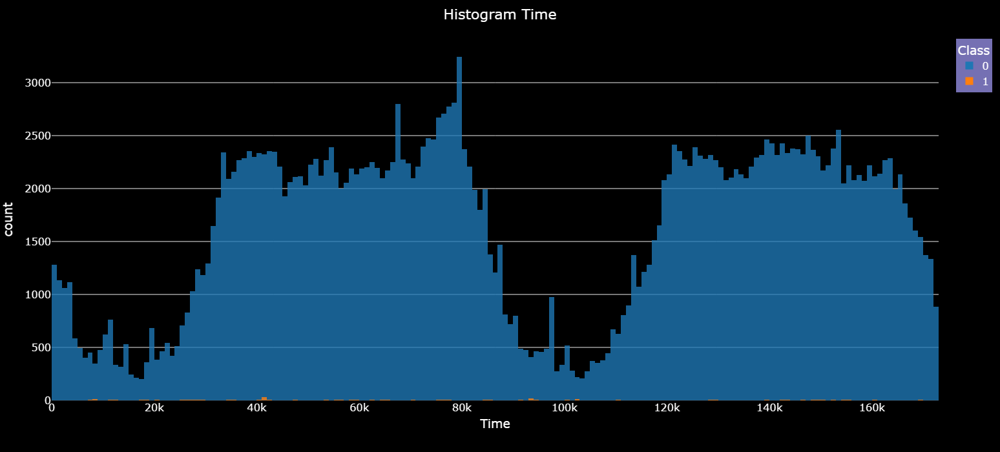

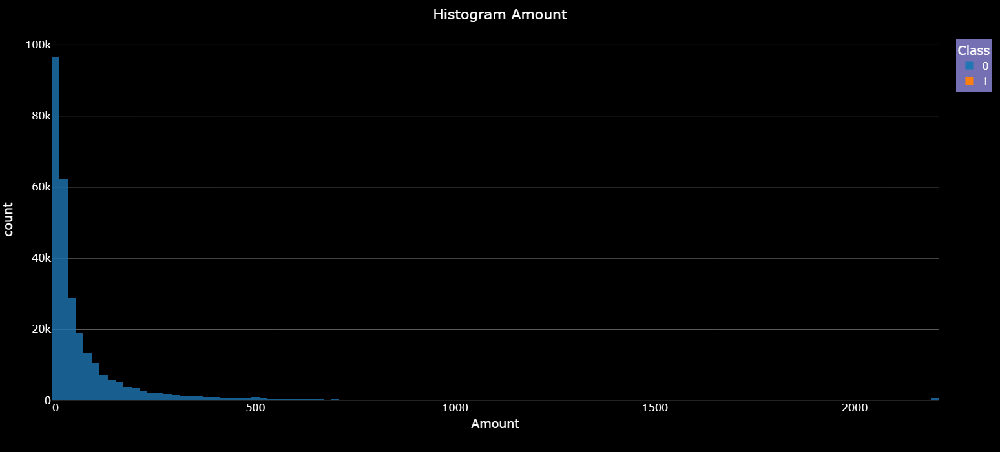

In [40]:
pio.templates['new_template']['layout']['font'] = {'family': 'verdana', 'size': 16, 'color': 'white'}

fig = px.histogram(df_data_processing, x="Time", color="Class", opacity=0.8, barmode='overlay')

fig.update_layout(
    title=f"Histogram Time",
)

fig.show()

fig = px.histogram(df_data_processing, x="Amount", color="Class", opacity=0.8, barmode='overlay', nbins=200)

fig.update_layout(
    title=f"Histogram Amount",
)

fig.show()

><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>In our examined graphs:
<br>- Apparently the dataset contains data for approximately 48 hours (2 days), with minimum transactions in the early morning hours.
<br>- After $2150, there are no fraudulent transactions, there may be a second validation for larger transactions.
<br>- The separate distribution of legal and fraudulent transactions has the same form of right asymmetric distribution.
></ul>
></div>

## Regresion logistica

### Scaling Data

><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>Then:
<br>- Lasso, Ridge, and Elastic Net regressions are powerful models, but they require normalization because the penalty coefficients are the same for all variables. We will use standardization in this case because it does not reduce the probability distribution of a variable if there are outliers, as is the case with normalization. But we will not take the 'Class' variable from the standardization since it will take a discrete value when applying standardization. It will be taken in the format 0 and 1 coming from df_data_processing.
></ul>
></div>

In [41]:
scaler = StandardScaler()
df_data_scaled = scaler.fit_transform(df_data_processing)

In [42]:
df_data_scaled = pd.DataFrame(df_data_scaled, columns = df_data_processing.columns)

### We divide the data set into features and the target of our model

In [43]:
X = df_data_scaled.drop(['Class'], axis=1)
y = df_data_processing['Class']

### Balance data application

In [44]:
sm = SMOTE(random_state=42)
X, y = sm.fit_resample(X, y)

><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>Then:
<br>- When the distribution of instances to classes is skewed, the precision fails to capture the actual performance of the algorithm. For this reason, we will use a class balancing pipeline with the Smote library, in this case we are forced to use data with PCA before SMOTE, since the data comes pre-treated with PCA. [link discussion on the issue in kaggle](https://www.kaggle.com/questions-and-answers/142430)
></ul>
></div>

## Comparing different Algorithms for Binary Classification on datasets

### Funtion to visualization matrix confusion in ploty

In [45]:
def matrix_confusion_plotly(cm, name):
    pio.templates['new_template']['layout']['font'] = {'family': 'verdana', 'size': 16, 'color': 'white'}

    x_matrix = ['False', 'True']
    y_matrix = ['True', 'False']

    z_text = [['TN', 'FP'],
              ['FN', 'TP']]

    # Display element name and prediction on hover

    hover_text = [['True Neg', 'False Pos'],
              ['False Neg', 'True Pos']]

    hover=[]
    for _ in range(len(z_text)):
        hover.append([i + '<br>' + 'Quantity  prediction: ' + str(j) + '<br>' + 'Percentage data in each quadrant: ' + str(round(j/np.sum(cm)*100, 2)) + '%' 
                      for i, j in zip(hover_text[_], cm[_])])

    fig = ff.create_annotated_heatmap(cm[::-1], x=x_matrix, y=y_matrix, annotation_text=z_text[::-1], text=hover[::-1], hoverinfo='text', colorscale=px.colors.diverging.RdBu[::-1], showscale=True)

    fig.update_layout(title_text=f'<i><b>Confusion matrix for {name}</b></i>')

    # add custom xaxis title
    fig.add_annotation(dict(font=dict(color="white",size=14),
                            x=0.5,
                            y=-0.12,
                            showarrow=False,
                            text="Predicted value",
                            xref="paper",
                            yref="paper"))

    # add custom yaxis title
    fig.add_annotation(dict(font=dict(color="white",size=14),
                            x=-0.08,
                            y=0.5,
                            showarrow=False,
                            text="Real value",
                            textangle=-90,
                            xref="paper",
                            yref="paper"))

    fig.update_layout(width=560, height=560)
    fig.show()

### Models

><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Observations</div>
><ul style="font-size:16px;">
>
>Then:
<br>- Due to the size of the dataset, we will use few classification algorithms, for cross validation (cv), we will use random permutation cross-validation iterator (ShuffleSplit) since as the data set grows, the cross validation time increases , which makes random splits a more attractive alternative. You can read about the benefits of applying ShuffleSplit [here](https://amueller.github.io/aml/04-model-evaluation/1-data-splitting-strategies.html#:~:text=interesting%20variant%20is-,shuffle%20split,-and%20stratified%20shuffle)
<br>- Many of our variables V1-v28 have outliers, this could be appreciated graphically when observing their distributions, for this reason when making our models, perhaps non-linear models are more convenient for us, such as models based on trees as they are more resistant to outliers, read [community responses](https://www.quora.com/Why-are-tree-based-models-robust-to-outliers). Or maybe a model like KNeighborsRegressor's as the default metric uses 'minkowski', which reduces the impact that outliers will have on the model, read [article](https://www.neuraldesigner.com/blog/3_methods_to_deal_with_outliers#:~:text=3.-,Minkowski%20error,-Now%2C%20we%20talk).
></ul>
></div>

  0%|          | 0/4 [00:00<?, ?it/s]

├──GridSearchCV of LogisticRegression:
	├──Best Estimator:  LogisticRegression(C=21.54434690031882, max_iter=1000, n_jobs=-1,
                   random_state=42, solver='liblinear')
	├──Best recall Score on Train:  0.9475149011785611
	├──Best Params:  {'C': 21.54434690031882, 'max_iter': 1000, 'n_jobs': -1, 'penalty': 'l2', 'random_state': 42, 'solver': 'liblinear'} 




,precision,recall,f1-score,support
0,0.924808,0.975470,0.949463,56461
1,0.974232,0.921219,0.946984,56841
accuracy,0.948253,0.948253,0.948253,0
macro avg,0.949520,0.948344,0.948224,113302
weighted avg,0.949603,0.948253,0.948219,113302


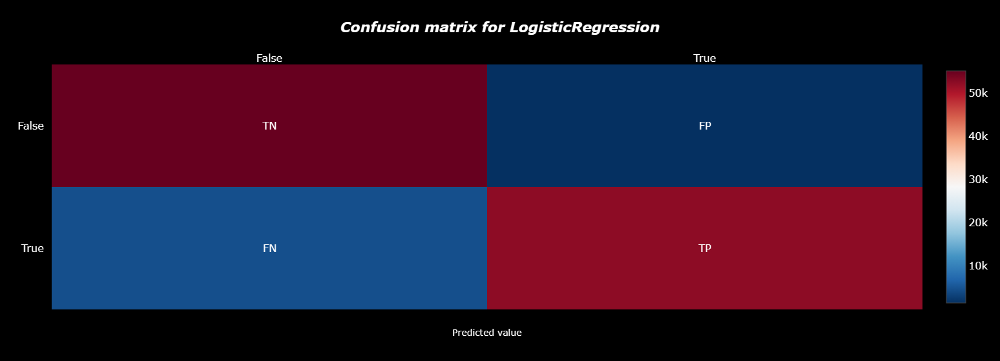

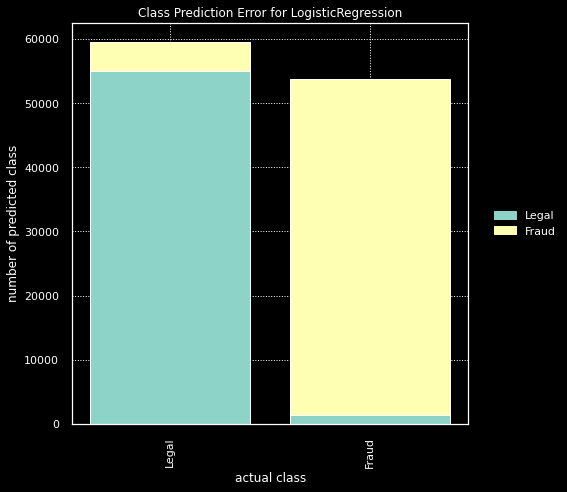

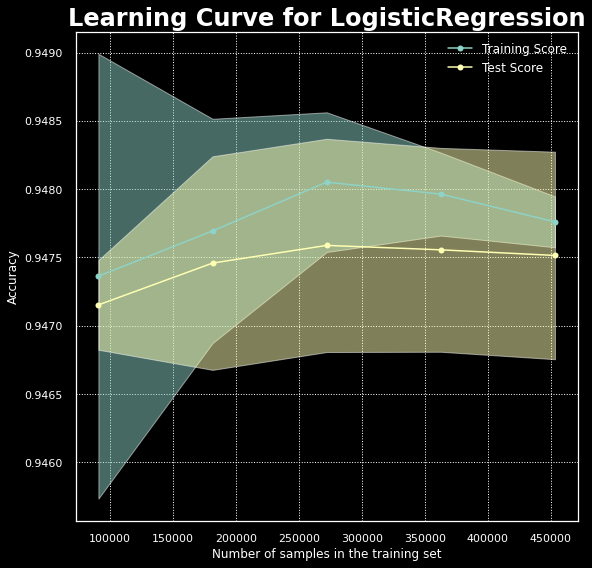




 _____________________________________________________________________________________ 



├──GridSearchCV of RandomForestClassifier:
	├──Best Estimator:  RandomForestClassifier(criterion='entropy', max_depth=32, n_estimators=64,
                       n_jobs=-1, random_state=42)
	├──Best recall Score on Train:  0.9998852623960742
	├──Best Params:  {'criterion': 'entropy', 'max_depth': 32, 'n_estimators': 64, 'n_jobs': -1, 'random_state': 42} 




,precision,recall,f1-score,support
0,1.000000,0.999787,0.999894,56461
1,0.999789,1.000000,0.999894,56841
accuracy,0.999894,0.999894,0.999894,0
macro avg,0.999894,0.999894,0.999894,113302
weighted avg,0.999894,0.999894,0.999894,113302


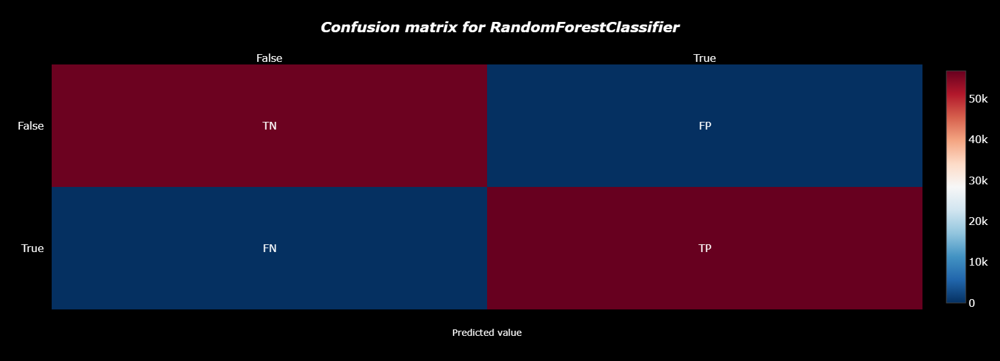

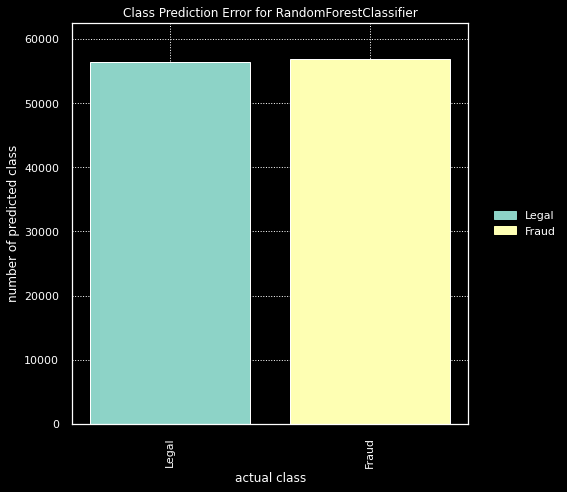

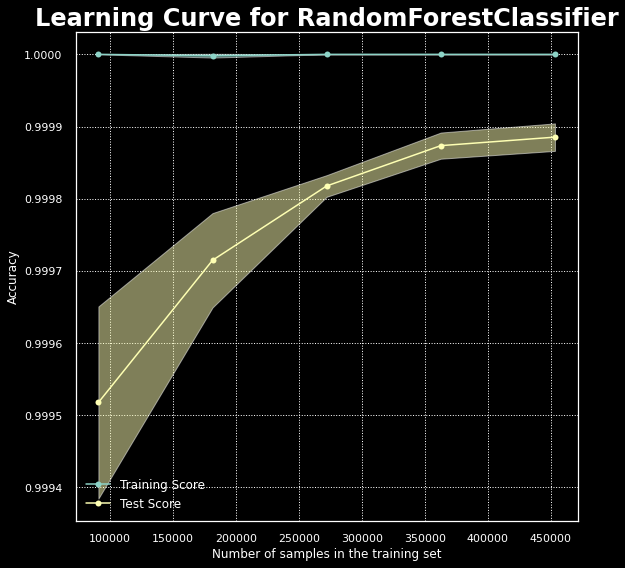




 _____________________________________________________________________________________ 



├──GridSearchCV of DecisionTreeClassifier:
	├──Best Estimator:  DecisionTreeClassifier(criterion='entropy', max_depth=32, random_state=42)
	├──Best recall Score on Train:  0.9984436873723913
	├──Best Params:  {'criterion': 'entropy', 'max_depth': 32, 'random_state': 42} 




,precision,recall,f1-score,support
0,0.999308,0.997644,0.998476,56461
1,0.997664,0.999314,0.998488,56841
accuracy,0.998482,0.998482,0.998482,0
macro avg,0.998486,0.998479,0.998482,113302
weighted avg,0.998483,0.998482,0.998482,113302


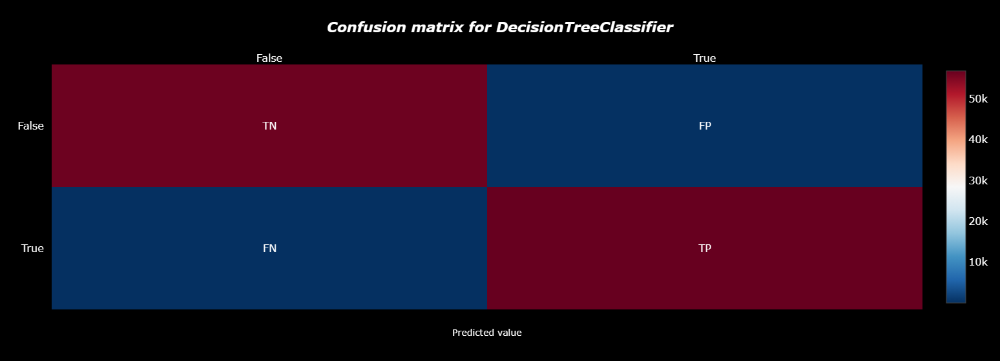

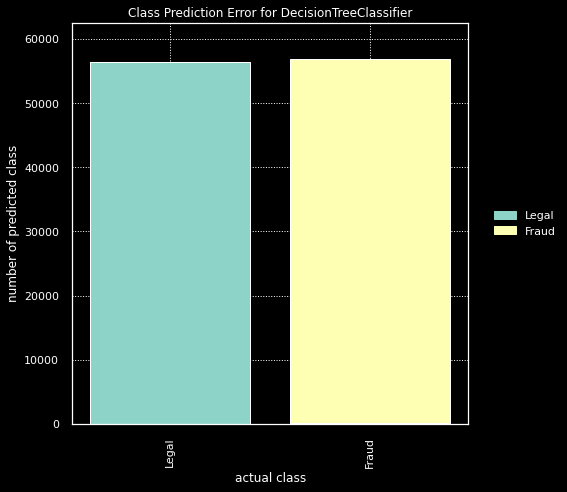

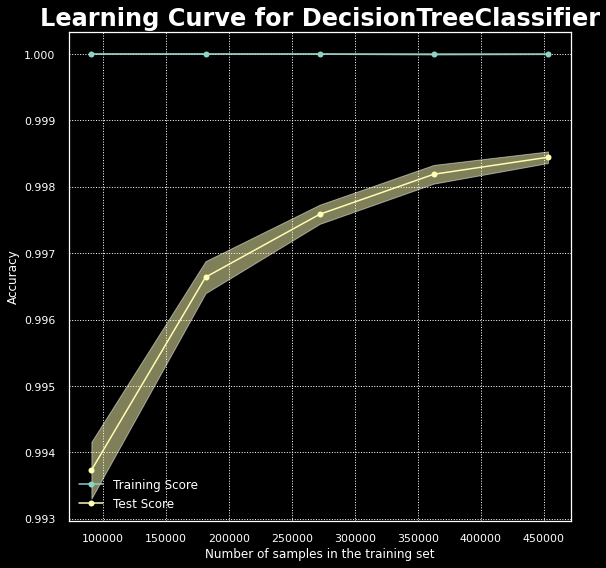

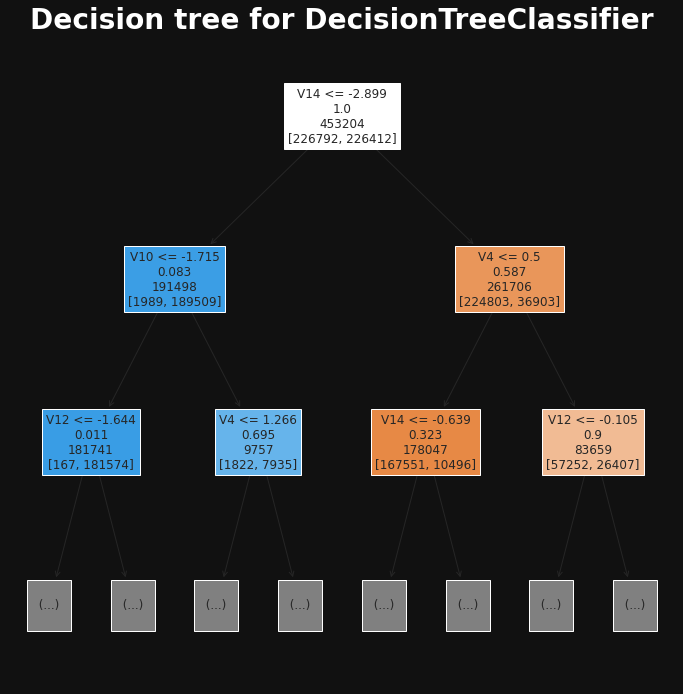




 _____________________________________________________________________________________ 



├──GridSearchCV of KNeighborsClassifier:
	├──Best Estimator:  KNeighborsClassifier(n_jobs=-1, n_neighbors=3, weights='distance')
	├──Best recall Score on Train:  0.9993998340717729
	├──Best Params:  {'metric': 'minkowski', 'n_jobs': -1, 'n_neighbors': 3, 'p': 2, 'weights': 'distance'} 




,precision,recall,f1-score,support
0,1.000000,0.998707,0.999353,56461
1,0.998717,1.000000,0.999358,56841
accuracy,0.999356,0.999356,0.999356,0
macro avg,0.999359,0.999354,0.999356,113302
weighted avg,0.999357,0.999356,0.999356,113302


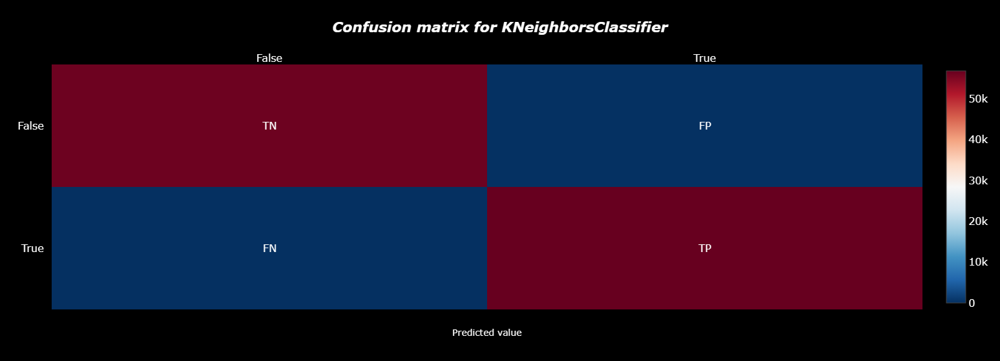

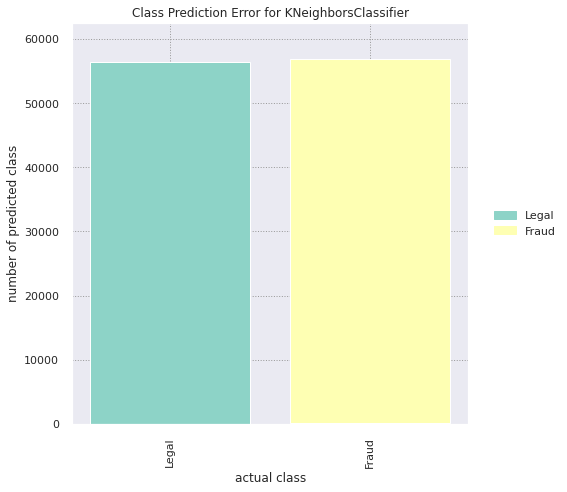

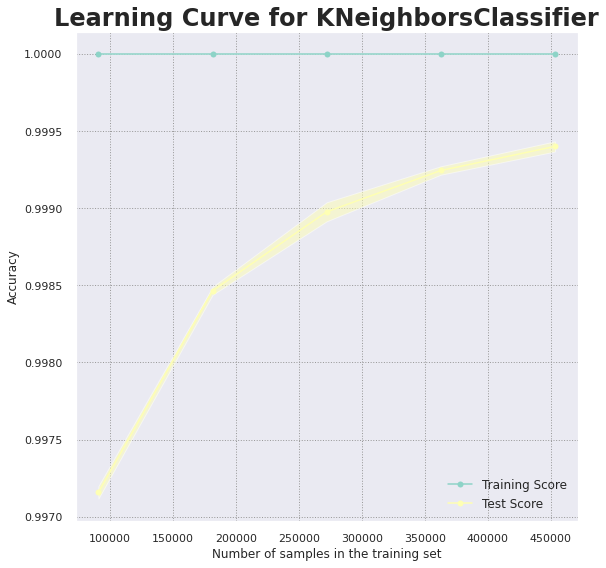




 _____________________________________________________________________________________ 





In [46]:
import warnings
warnings.filterwarnings("ignore")

# method used a cross-validation procedure
cv = ShuffleSplit(n_splits=3, test_size=0.2, random_state=0)


# Grid for classifier
reg_classifier = {
    'LogisticRegression': LogisticRegression(),
    'RandomForestClassifier': RandomForestClassifier(),
    'DecisionTreeClassifier': DecisionTreeClassifier(),
    'KNeighborsClassifier': KNeighborsClassifier(),
}


params = {
    'LogisticRegression':
        {
         "C": np.logspace(-4, 4, 4),
         "penalty": ['l1', 'l2'],
         "solver": ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
         'max_iter': [1000],
         'random_state': [42],
         'n_jobs': [-1],
        },
     'RandomForestClassifier':
        {
         "criterion": ['entropy', 'gini'],
         "n_estimators": [64],
         "max_depth": [32],
         'random_state': [42],
         'n_jobs': [-1],
        },
    'DecisionTreeClassifier':
        {
        "criterion": ['entropy', 'gini'],
         "max_depth": [32],
         'random_state': [42],
        },
    'KNeighborsClassifier':
        {
         'n_neighbors': [3],
         'weights': ['distance'],
         'n_jobs': [-1],
         'metric': ['minkowski'],
         'p': [2],
        },
}

# Grid for LearningCurveDisplay
common_params = {
    "X": X,
    "y": y,
    "train_sizes": np.linspace(0.2, 1.0, 5),
    "cv": cv,
    "score_type": "both",
    "n_jobs": -1,
    "line_kw": {"marker": "o"},
    "std_display_style": "fill_between",
    "score_name": "Accuracy",
    "random_state": 42
}


# Dict and list to save score to models
models_best = {}
models_names = []
test_scores = []
train_scores = []



###################################### Models deployment ###########################################



for name, reg in tqdm(reg_classifier.items()):
    grid_reg = GridSearchCV(reg, params.get(name), n_jobs=-1, cv=cv).fit(X, y)
    score = np.abs(grid_reg.best_score_)

    #Getting the best estimators, score & parameters
    GridSearchCV
    print(f'├──GridSearchCV of {name}:')
    print(f'\t├──Best Estimator:  {grid_reg.best_estimator_}')
    print(f'\t├──Best recall Score on Train:  {grid_reg.best_score_}')
    print(f'\t├──Best Params:  {grid_reg.best_params_} \n\n')


    # Best model for comparative Roc Curves
    models_best[name] = grid_reg.best_estimator_


    # Split with 'X' and 'y' balanced and pca_components_best of 'X'
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)


    # Training our best model and prediction
    model = grid_reg.best_estimator_.fit(X_train, y_train)
    prediction = model.predict(X_test)


    # View report with pro style
    df = pd.DataFrame(classification_report(y_test,
                                            prediction, 
                                            digits=2,
                                            output_dict=True)).T
    
    
    df['support'] = df.support.apply(int)

    pandas_title(df.style.background_gradient(cmap='coolwarm',
                                 subset=pd.IndexSlice['0':'1', :'f1-score']), f'Report metrics of best estimator {name}')


    # Display table results Test_Score and Train_Score for all models
    models_names.append(name)
    test_scores.append(model.score(X_test, y_test)*100)
    train_scores.append(model.score(X_train, y_train)*100)



    # Function plot matrix confusion with plotly
    cm = confusion_matrix(y_test, prediction, labels=model.classes_)
    matrix_confusion_plotly(cm, name)


    # Class Prediction Error of result LogisticRegression# Class Prediction Error of result LogisticRegression
    ## Instantiate the classification model and visualizer
    fig, ax = plt.subplots(figsize=(9,7))
    visualizer = ClassPredictionError(grid_reg.best_estimator_, classes=['Legal', 'Fraud'])
    ## Fit the training data to the visualizer
    visualizer.fit(X_train, y_train)
    ## Evaluate the model on the test data
    visualizer.score(X_test, y_test)
    ## Draw visualization
    visualizer.show()


    # Learning Curve visualization
    fig, ax = plt.subplots(figsize=(9,9))
    LearningCurveDisplay.from_estimator(grid_reg.best_estimator_, **common_params, ax=ax)
    handles, label = ax.get_legend_handles_labels()
    ax.legend(handles[:2], ["Training Score", "Test Score"], fontsize=12)
    plt.title(f"Learning Curve for {name}", fontsize=24, fontdict={"weight": "bold"})
    plt.show()


#     # ROC Curve single
#     fig, ax = plt.subplots(figsize=(9,9))
#     clf = grid_reg.best_estimator_.fit(X_train, y_train)
#     RocCurveDisplay.from_estimator(clf, X_test, y_test, ax=ax)
#     plt.title(f"ROC Curve for {name}",
#                   fontsize=24, fontdict={"weight": "bold"})
#     plt.show()


    # Plot a decision tree
    if name == 'DecisionTreeClassifier':
        mpl.rcParams['text.color'] = 'black'
        sns.set_style('darkgrid', {"grid.color": ".6", "grid.linestyle": ":"})
        fig, ax = plt.subplots(figsize=(12, 12), facecolor='k')
        plot_tree(grid_reg.best_estimator_, feature_names=list(X.columns), label=list(np.unique(y)), filled=True, fontsize=12, max_depth= 2, ax=ax)
        plt.title(f"Decision tree for {name}", color='white', fontsize=28, fontweight='bold')
        plt.show()

    print('\n' * 3, '_' * 85, '\n' * 3)

## Evaluation of Results

In [47]:
def RocCurves_plotly(models):
    # Create an empty figure, and iteratively add new lines
    # every time we compute a new class
    fig = go.Figure()
    fig.add_shape(
        type='line', line=dict(dash='dash'),
        x0=0, x1=1, y0=0, y1=1
    )

    for name, reg in models.items():
        # Fit the model
        reg.fit(X_train, y_train)
        y_score = reg.predict_proba(X_test)[:, 1]

        fpr, tpr, thresholds = roc_curve(y_test, y_score)
        auc_score = roc_auc_score(y_test, y_score)

        name = f"{name} (AUC={auc_score:.2f})"
        fig.add_trace(go.Scatter(x=fpr, y=tpr, name=name, mode='lines'))

    fig.update_layout( 
        title="Roc Curves all best classifier",
        xaxis_title='False Positive Rate',
        yaxis_title='True Positive Rate',
        yaxis=dict(scaleanchor="x", scaleratio=1),
        xaxis=dict(constrain='domain'),
    )
    fig.show()

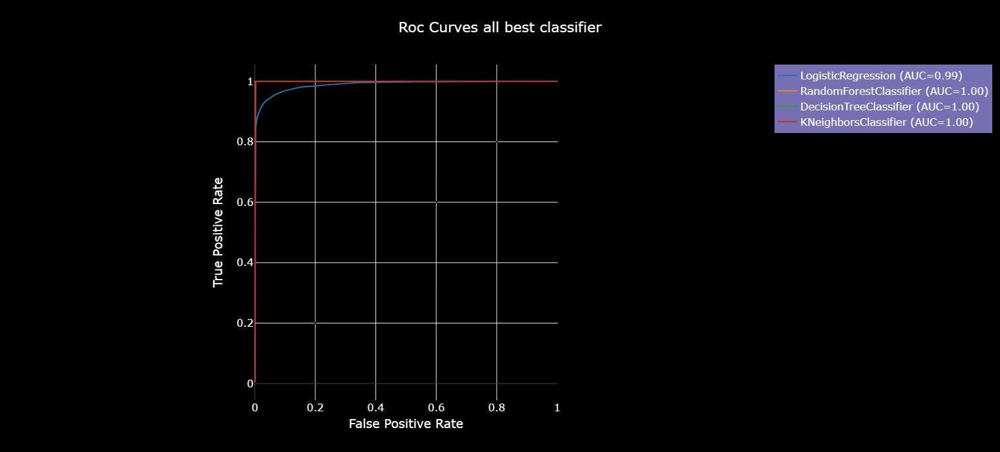

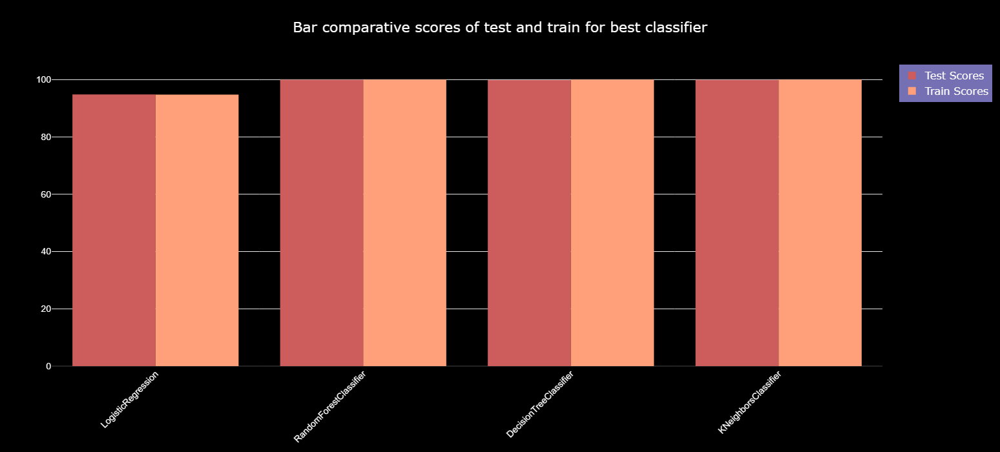

In [48]:
# plot RocCurves for best classifier
RocCurves_plotly(models_best)

dict_models_scores = {'Model': models_names, 'Test Score': test_scores, 'Train Score': train_scores} 

df = pd.DataFrame(dict_models_scores)


# plot bar comparative scores test and train for best classifier
fig = go.Figure()
fig.add_trace(go.Bar(
    y=df['Test Score'],
    x=df['Model'],
    name='Test Scores',
    marker_color='indianred'
))
fig.add_trace(go.Bar(
    y=df['Train Score'],
    x=df['Model'],
    name='Train Scores',
    marker_color='lightsalmon'
))

# Here we modify the tickangle of the xaxis, resulting in rotated labels.
fig.update_layout(barmode='group', xaxis_tickangle=-45, title="Bar comparative scores of test and train for best classifier",)

fig.update_yaxes(tickfont=dict(family='Arial', size=14), automargin='height')
fig.update_xaxes(tickfont=dict(family='Arial', size=14), automargin='height')
fig.show()

><div style="background-color: #F6FFF6;"> 
><div style="font-weight: bold;font-size:18px">Overall conclusion</div>
><ul style="font-size:16px;">
>
>At the end of our EDA and clustering, we obtained:
<br>- Almost all the algorithms used, had an almost perfect performance, and the logistic regression that was the one that generated the worst performance, even so, obtained a quite remarkable precision of 97.42% for the fraud variable, which is the variable that we want to predict, since with 7.52% of legal transactions that will be marked as fraud with this model, a second factor validation can be used or use other tools to verify if it is fraudulent or not.
<br>- Many questions remained as to what additional information the data could provide, but it is understood that encoding with PCA was the only way this data could reach kaggle for analysis by the data science community.
></ul>
></div>

## Export libraries from Notebook

In [49]:
# !pip install -q pipreqsnb
# !pipreqsnb '.' --force

# Edit to requirements.txt with any additional libraries you require

---

<p>
  Enlace to
  <a
    href="https://github.com/AAZG/Implementation-of-binary-classification-for-Credit-Card-Fraud-Detection"
    title="Fork to repository"
    >project's GitHub repository</a
  >.
</p>

---
*Contact:*
---

<a href="https://www.linkedin.com/in/aazg"><img align=centerright src="https://cdn-icons-png.flaticon.com/512/3992/3992606.png"  width="55" height="55" target="_blank" alt="Go to my Linkedin profile" title="Go to my Linkedin profile"></a>

<a href="https://github.com/AAZG"><img align=centerright src="https://cdn-icons-png.flaticon.com/512/5968/5968846.png"  width="55" height="55" target="_blank" alt="Go to my Github profile" title="Go to my Github profile"></a>

<a href="https://www.kaggle.com/alfonsozapata"><img align=centerright src="https://cdn-icons-png.flaticon.com/512/3665/3665933.png"  width="55" height="55" target="_blank" alt="Go to my Kaggle profile" title="Go to my Kaggle profile"></a>

<a href="https://deepnote.com/@aazg"><img align=centerright src="https://cdn-icons-png.flaticon.com/512/3665/3665927.png"  width="55" height="55" target="_blank" alt="Go to my Deepnote profile" title="Go to my Deepnote profile"></a>

<a href="https://www.datascienceportfol.io/aazg"><img align=centerright src="https://cdn-icons-png.flaticon.com/512/351/351456.png"  width="55" height="55" target="_blank" alt="View my portfolio in my Web page" title="View my portfolio in my Web page"></a>

<a href="https://api.whatsapp.com/send?phone=584128869169&text=Hi,%20i%27m%20insterested%20on%20your%20services"><img align=centerright src="https://cdn-icons-png.flaticon.com/512/4423/4423697.png"  width="55" height="55" target="_blank" alt="Start a Whatsapp conversation with me" title="Start a Whatsapp conversation with me"></a>

<a href="mailto:aazg24@gmail.com"><img align=centerright src="https://cdn-icons-png.flaticon.com/512/5968/5968534.png"  width="55" height="55" target="_blank" alt="Start a Mail conversation with me" title="Start a Mail conversation with me"></a>
    
<a href="https://twitter.com/AlfonsoZapata21"><img align=centerright src="https://cdn-icons-png.flaticon.com/512/1384/1384065.png"  width="55" height="55" target="_blank" alt="Go to my Twitter profile" title="Go to my Twitter profile"></a>

<a href="https://www.instagram.com/alfonsoandreszapataguzman/"><img align=centerright src="https://cdn-icons-png.flaticon.com/512/1409/1409946.png"  width="55" height="55" target="_blank" alt="Go to my Instagram profile" title="Go to my Instagram profile"></a>




*Let’s change the world, Together!*

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=9dd13b3d-1e27-4f69-ad18-621f5e71f5fe' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>